### Juan David Galan Vargas
## Visualización de datos

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

In [3]:
cuadrantes={}
for j in range(8):
    folder_path = r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\8 Semestre\Proyecto Teorico\Proyecto Teorico 20242\Gaia-DR3-Proyecto-Teorico-20242\data_v2\shell1\Q"+str(j+1)
    dataframes = {}
    for file_name in os.listdir(folder_path):
        if file_name.endswith('.csv'):
            file_path = os.path.join(folder_path, file_name)
            df = pd.read_csv(file_path)
            dataframes[file_name]=df
    cuadrantes["Q"+str(j+1)]=dataframes

In [4]:
cuadrantes["Q1"].keys()

dict_keys(['cluster_0.csv', 'cluster_1.csv', 'cluster_10.csv', 'cluster_11.csv', 'cluster_12.csv', 'cluster_13.csv', 'cluster_14.csv', 'cluster_15.csv', 'cluster_16.csv', 'cluster_17.csv', 'cluster_18.csv', 'cluster_19.csv', 'cluster_2.csv', 'cluster_20.csv', 'cluster_21.csv', 'cluster_22.csv', 'cluster_23.csv', 'cluster_24.csv', 'cluster_25.csv', 'cluster_26.csv', 'cluster_27.csv', 'cluster_28.csv', 'cluster_29.csv', 'cluster_3.csv', 'cluster_30.csv', 'cluster_31.csv', 'cluster_32.csv', 'cluster_33.csv', 'cluster_34.csv', 'cluster_35.csv', 'cluster_36.csv', 'cluster_37.csv', 'cluster_38.csv', 'cluster_39.csv', 'cluster_4.csv', 'cluster_40.csv', 'cluster_41.csv', 'cluster_42.csv', 'cluster_43.csv', 'cluster_44.csv', 'cluster_45.csv', 'cluster_46.csv', 'cluster_47.csv', 'cluster_48.csv', 'cluster_49.csv', 'cluster_5.csv', 'cluster_50.csv', 'cluster_51.csv', 'cluster_52.csv', 'cluster_53.csv', 'cluster_54.csv', 'cluster_55.csv', 'cluster_56.csv', 'cluster_57.csv', 'cluster_58.csv', 'clus

In [5]:
cuadrantes["Q1"]["cluster_0.csv"]

,Unnamed: 0,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag
0,0,16.504385,16.777021,16.082998
1,1,17.653337,17.907545,17.233496
2,2,17.540915,17.823246,17.101484
3,3,18.267305,18.630150,17.746536
4,4,18.060926,18.478176,17.485458
...,...,...,...,...
72,72,18.297947,18.610718,17.810470
73,73,18.278788,18.621824,17.833464
74,74,18.371664,18.617447,17.904213
75,75,18.227999,18.562279,17.738651


In [6]:
row_counts=[]
for key in cuadrantes.keys():
    for cluster in cuadrantes[key].keys():
        df=cuadrantes[key][cluster]
        row_counts.append(len(df))

Text(0.5, 0, 'Miembros de Cumulo')

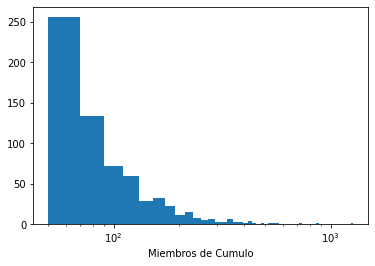

In [7]:
plt.hist(row_counts, bins=60)
plt.xscale('log')
plt.xlabel("Miembros de Cumulo")

Text(0.5, 0, 'Miembros de Cumulo')

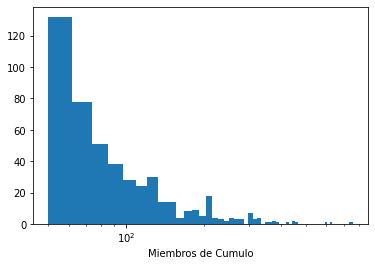

In [8]:
cuadrantes2={}
for j in range(8):
    folder_path = r"C:\Users\juang\Documents\Tareas JD\Universidad\Materias\8 Semestre\Proyecto Teorico\Proyecto Teorico 20242\Gaia-DR3-Proyecto-Teorico-20242\data_v2\shell2\Q"+str(j+1)
    dataframes = {}
    for file_name in os.listdir(folder_path):
        if file_name.endswith('.csv'):
            file_path = os.path.join(folder_path, file_name)
            df = pd.read_csv(file_path)
            dataframes[file_name]=df
    cuadrantes2["Q"+str(j+1)]=dataframes
    


row_counts2=[]
for key in cuadrantes2.keys():
    for cluster in cuadrantes2[key].keys():
        df=cuadrantes2[key][cluster]
        row_counts2.append(len(df))


plt.hist(row_counts2, bins=60)
plt.xscale('log')
plt.xlabel("Miembros de Cumulo")


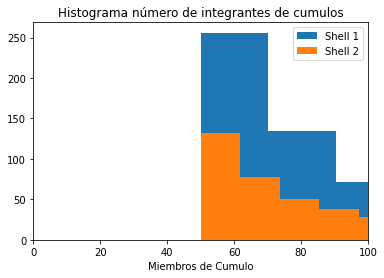

In [9]:
plt.hist(row_counts,bins=60,label="Shell 1")
plt.hist(row_counts2, bins=60,label="Shell 2")
#plt.xscale('log')
plt.xlim(0,100)
plt.xlabel("Miembros de Cumulo")
plt.title("Histograma número de integrantes de cumulos")
plt.legend()

In [10]:
len(row_counts), len(row_counts2)

(676, 499)

In [76]:
def graficar(cua,shell):
    if shell==1:
        cu=cuadrantes
    elif shell==2:
        cu=cuadrantes2
    dataframes=cu[cua]
    for i in dataframes.keys():
        fig, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(20, 7))
        df1=dataframes[i]
        ax2.scatter(df1["phot_bp_mean_mag"]-df1["phot_rp_mean_mag"],df1["phot_g_mean_mag"],marker=".")
        ax2.set_xlim(-1,4)
        ax2.set_ylim(11,21)
        ax2.grid(True)
        ax2.set_xlabel("Bp-Rp")
        ax2.set_ylabel("Gmag")
        ax2.set_title(i+" Cuadrante: "+cua+" Shell: "+str(shell))
        ax2.invert_yaxis()
        
        df1= df1.dropna(subset=['phot_g_mean_mag'])
        data=df1['phot_g_mean_mag']
        median = np.median(data)
        mean = np.mean(data)
        q1, q3 = np.percentile(data, [25, 75])
        iqr = q3 - q1
        sigma=np.std(data)
        
        ax1.boxplot(df1["phot_g_mean_mag"],showmeans=True, meanline=True)
        ax1.set_ylim(11,21)
        ax1.set_ylabel("Gmag")
        ax1.invert_yaxis()
        ax1.grid(True)
        ax1.set_title("Magnitud G")
        
        legend_labels = [
            f'Mean: {mean:.2f}',
            f'Median: {median:.2f}',
            f'IQR: {iqr:.2f} (Q1: {q1:.2f}, Q3: {q3:.2f})',
            f"Sigma: {sigma:2f}"
            ]

        ax1.legend(handles=[plt.Line2D([0], [0], color='green'), 
            plt.Line2D([0], [0], color='orange'), 
            plt.Line2D([0], [0], color='black')],
            labels=legend_labels, loc='upper right')
        
        df1["color"]=df1["phot_bp_mean_mag"]-df1["phot_rp_mean_mag"]
        df1= df1.dropna(subset=['color'])
        
        data=df1['color']
        median = np.median(data)
        mean = np.mean(data)
        q1, q3 = np.percentile(data, [25, 75])
        iqr = q3 - q1
        sigma=np.std(data)
        
        
        ax3.boxplot(df1["color"],vert=False,showmeans=True, meanline=True)
        ax3.set_xlim(-1,4)
        ax3.set_xlabel("Bp-Rp")
        ax3.grid(True)
        ax3.set_title("Color Bp-Rp")
        
        legend_labels = [
            f'Mean: {mean:.2f}',
            f'Median: {median:.2f}',
            f'IQR: {iqr:.2f} (Q1: {q1:.2f}, Q3: {q3:.2f})',
            f"Sigma: {sigma:2f}"
            ]

        ax3.legend(handles=[plt.Line2D([0], [0], color='green'), 
            plt.Line2D([0], [0], color='orange'), 
            plt.Line2D([0], [0], color='black')],
            labels=legend_labels, loc='upper right')

C:\Users\juang\AppData\Local\Temp/ipykernel_8540/2014730147.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["color"]=df1["phot_bp_mean_mag"]-df1["phot_rp_mean_mag"]
C:\Users\juang\AppData\Local\Temp/ipykernel_8540/2014730147.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["color"]=df1["phot_bp_mean_mag"]-df1["phot_rp_mean_mag"]
C:\Users\juang\AppData\Local\Temp/ipykernel_8540/2014730147.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfac

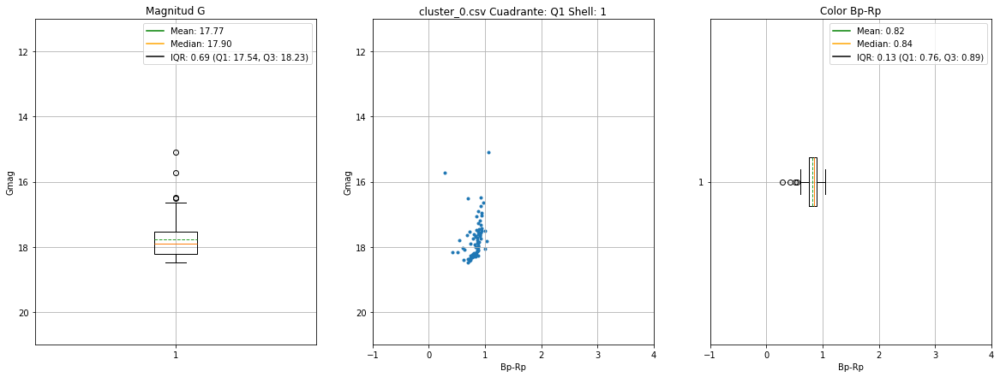

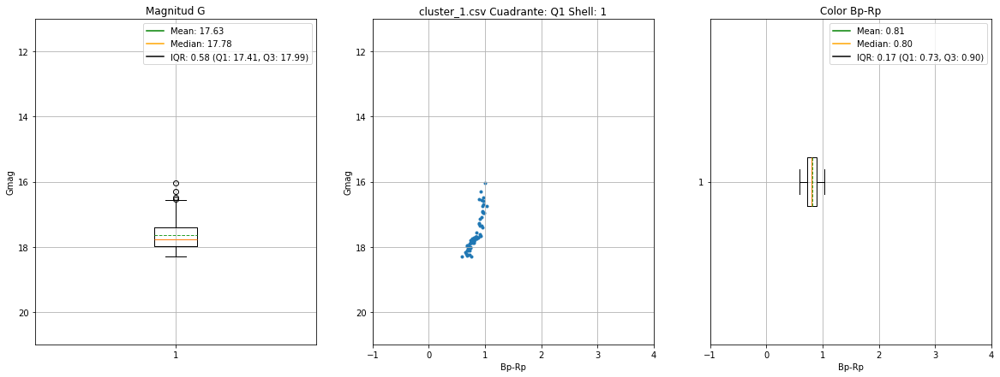

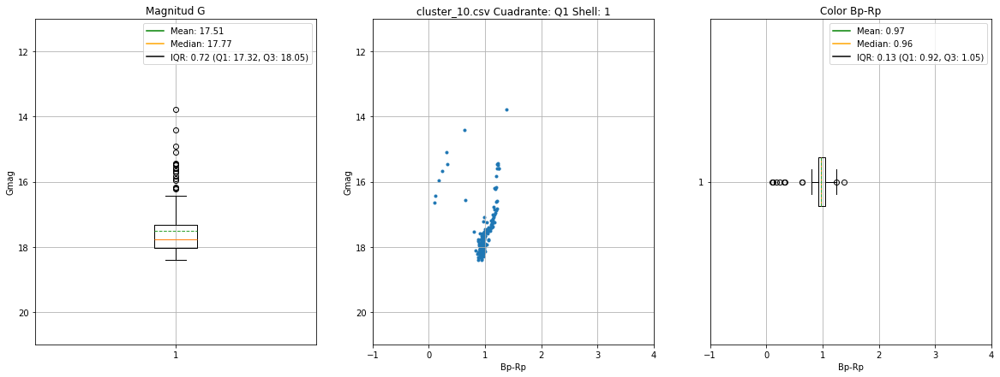

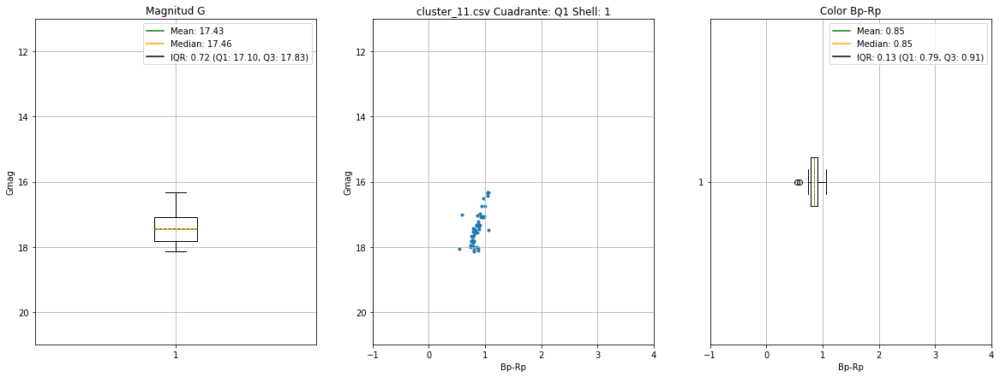

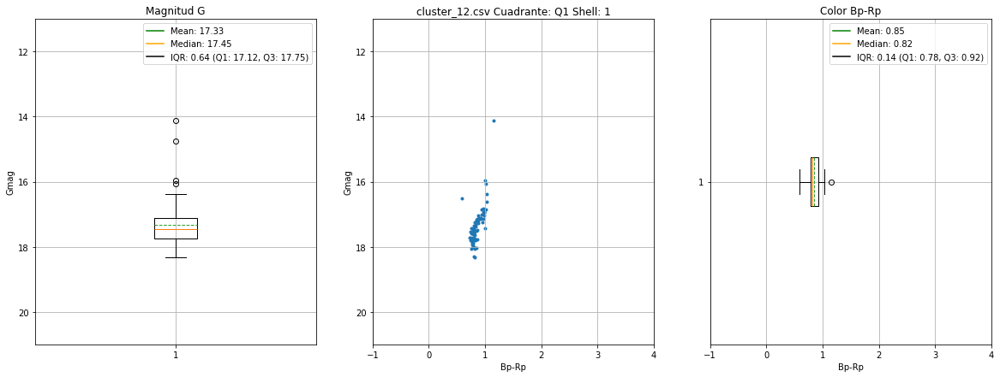

...

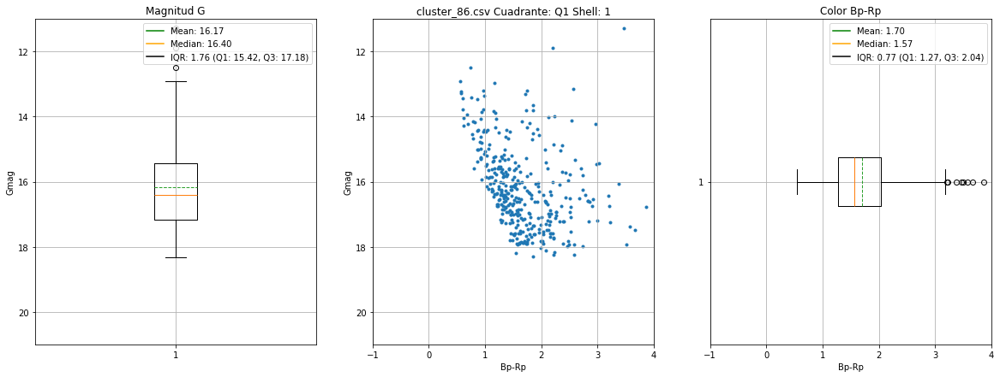

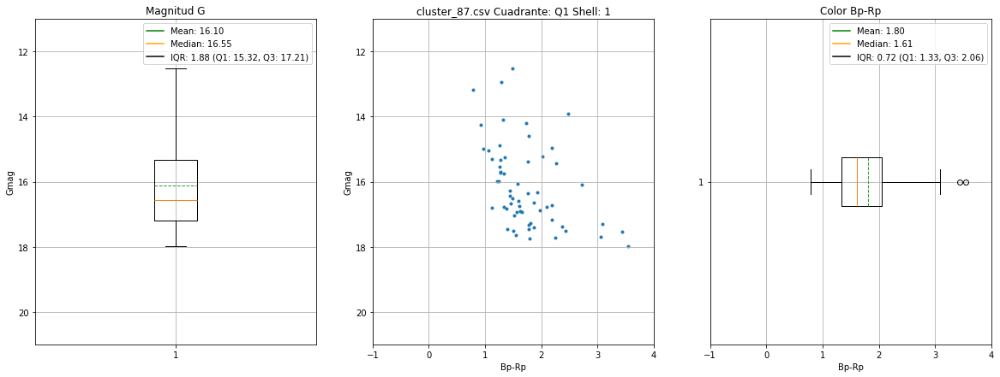

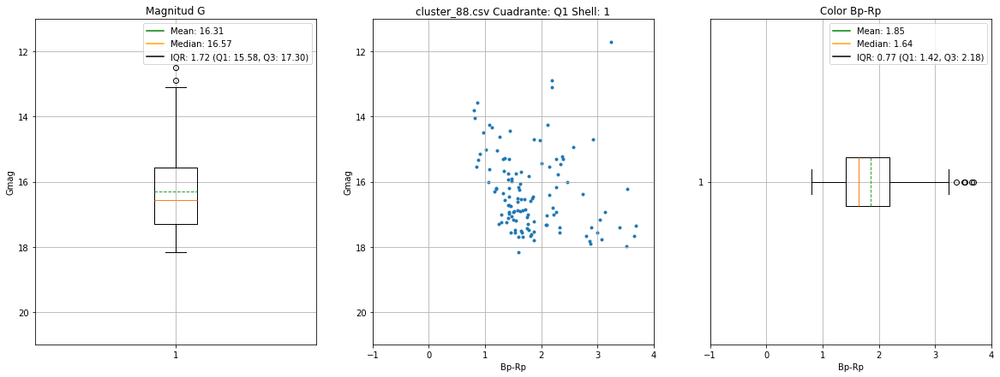

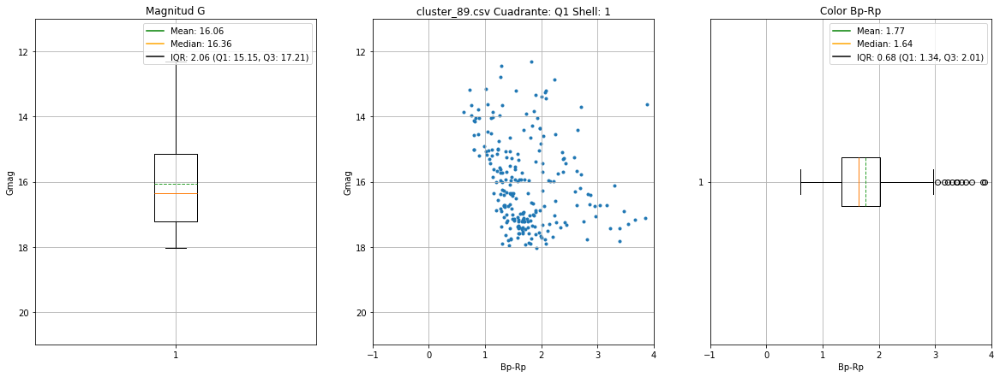

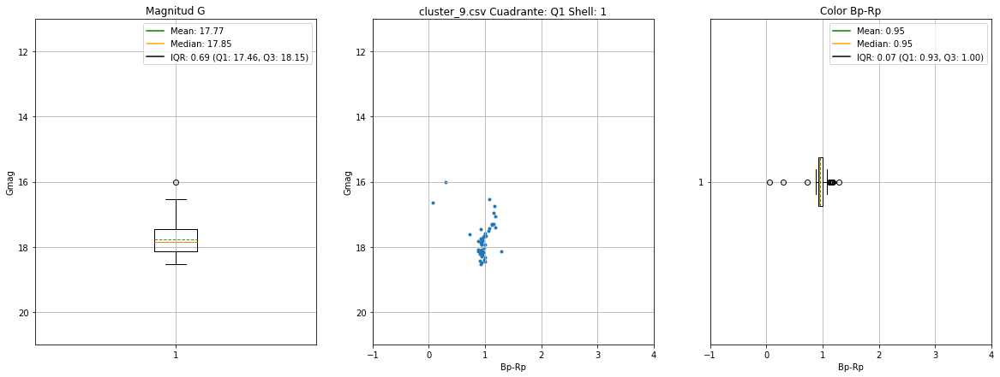

In [77]:
graficar("Q1",1)

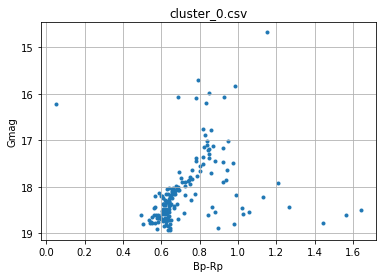

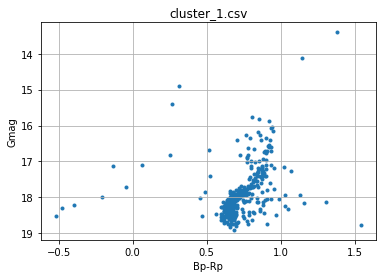

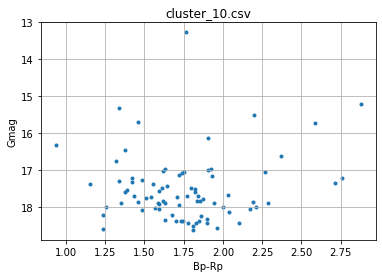

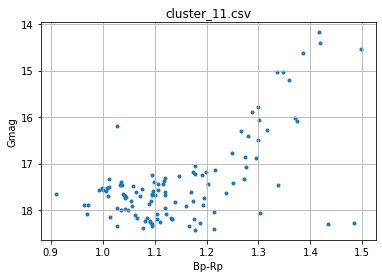

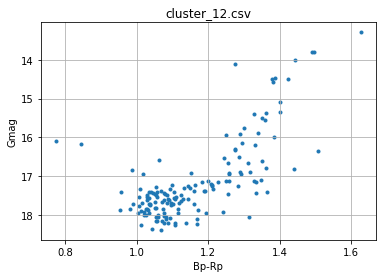

...

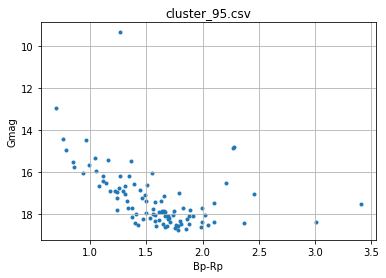

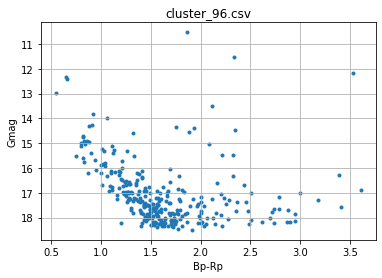

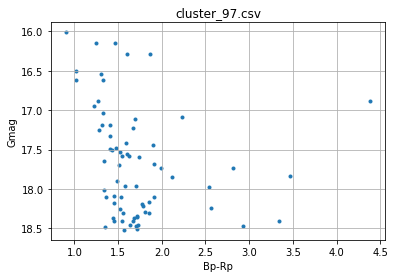

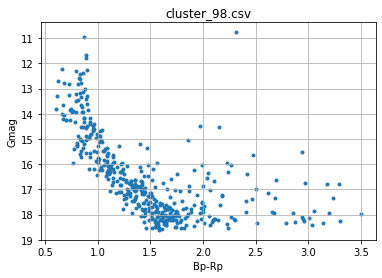

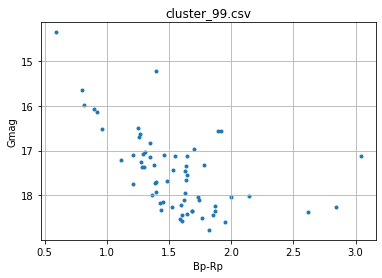

In [14]:
graficar("Q2",1)

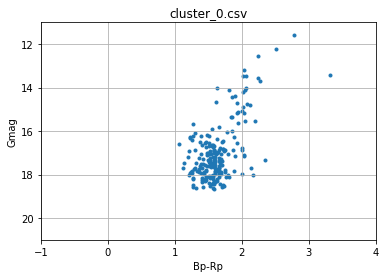

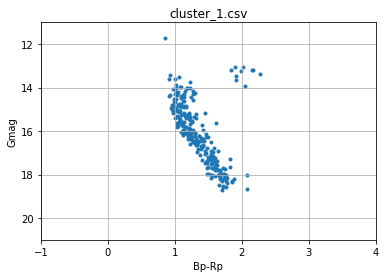

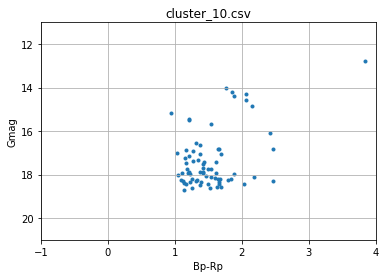

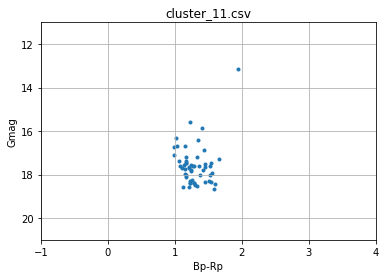

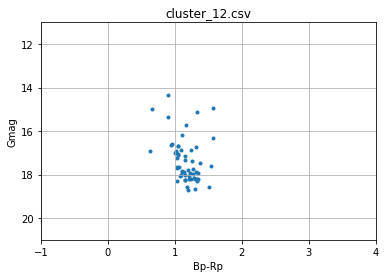

...

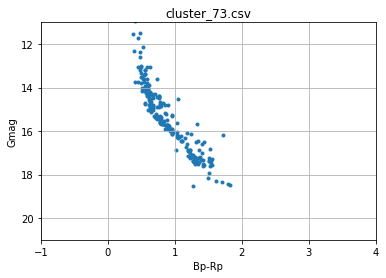

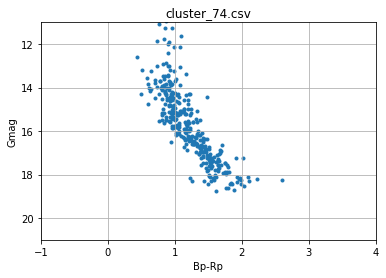

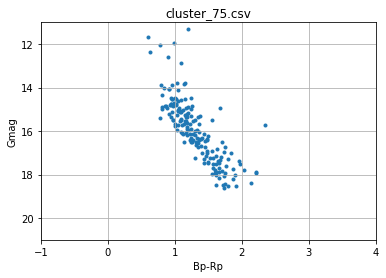

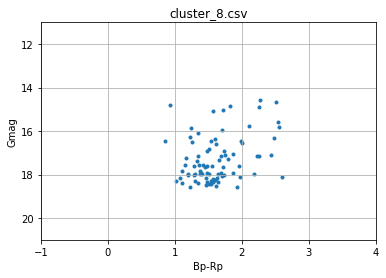

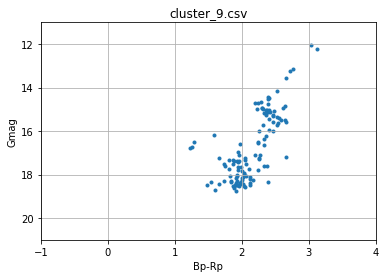

In [8]:
graficar("Q3",1)

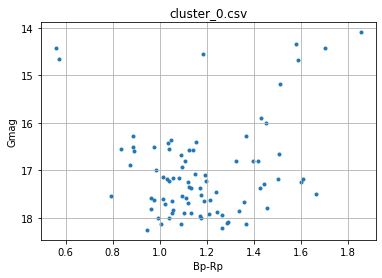

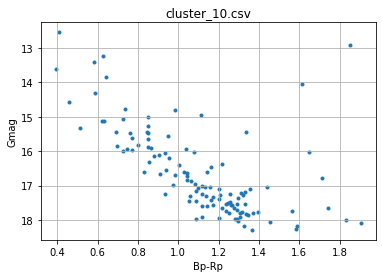

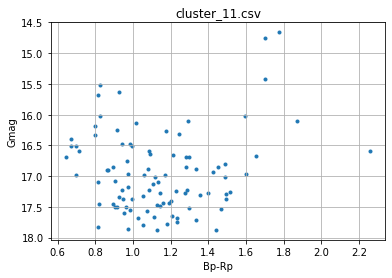

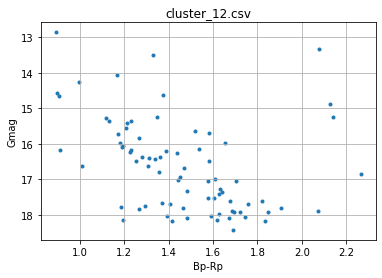

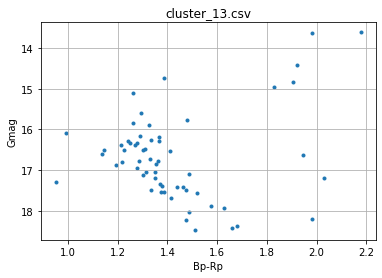

...

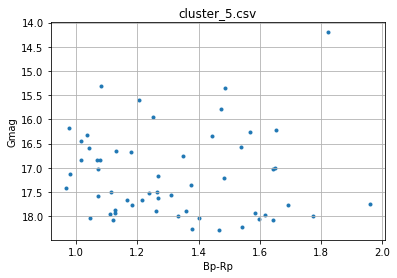

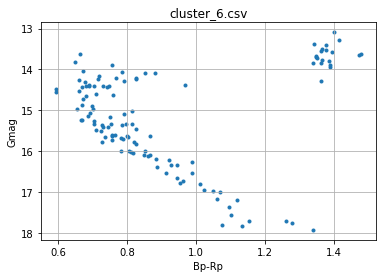

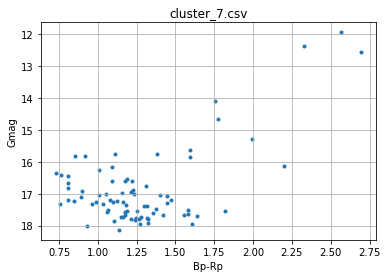

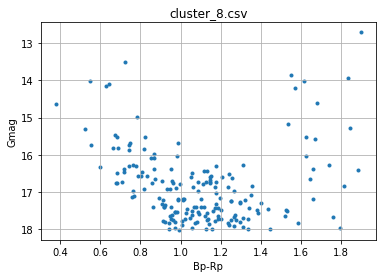

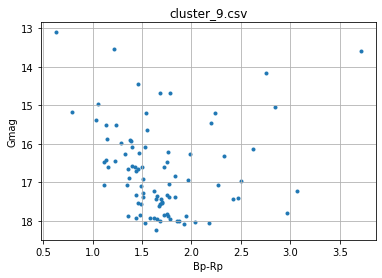

In [16]:
graficar("Q4",1)

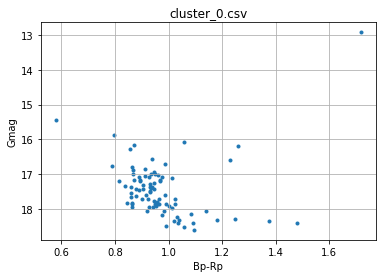

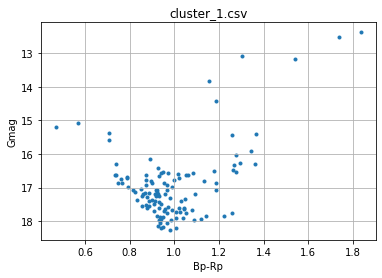

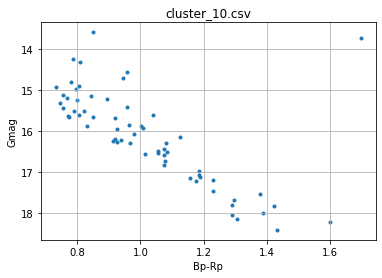

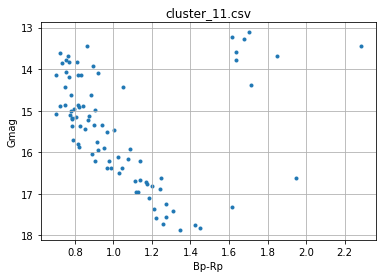

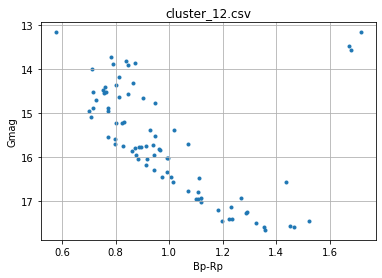

...

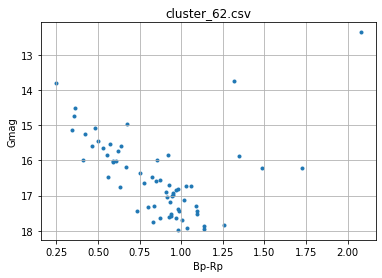

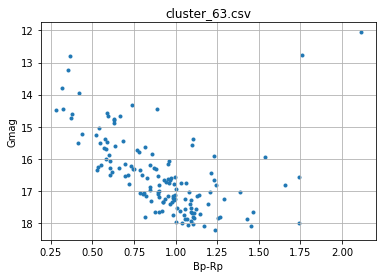

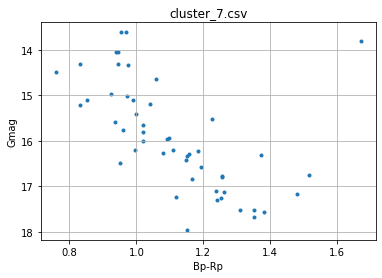

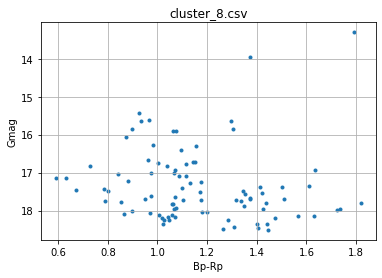

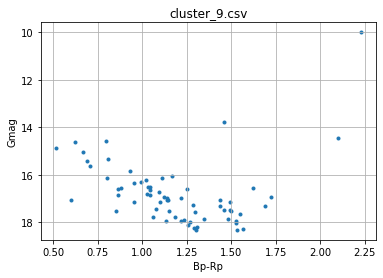

In [17]:
graficar("Q5",1)

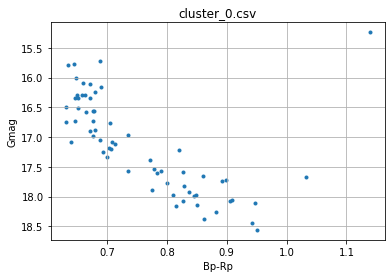

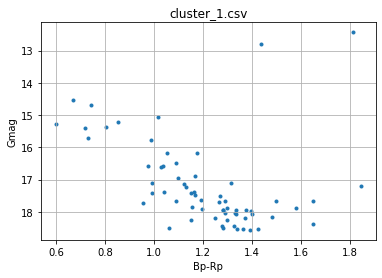

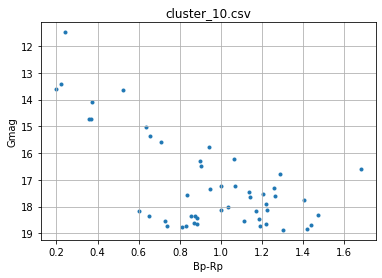

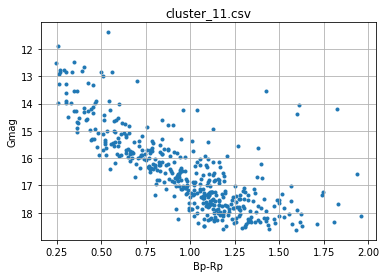

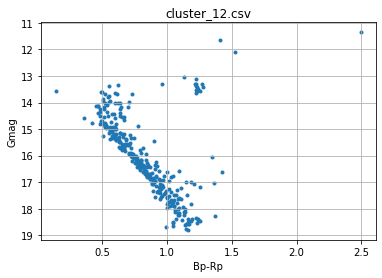

...

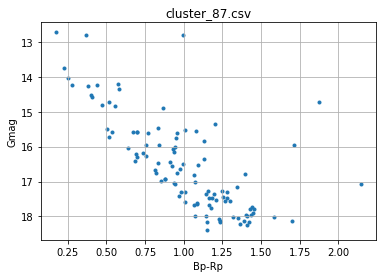

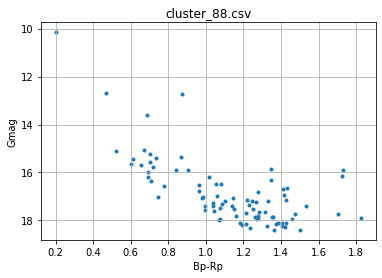

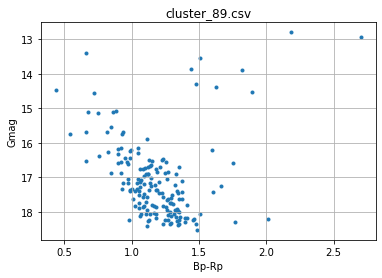

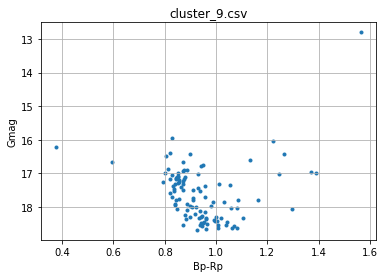

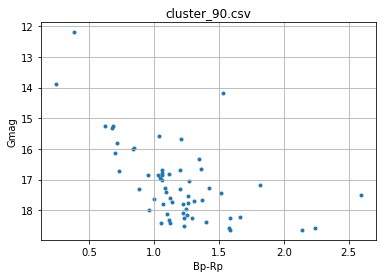

In [18]:
graficar("Q6",1)

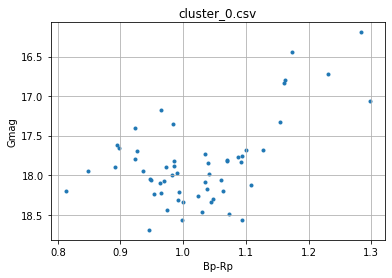

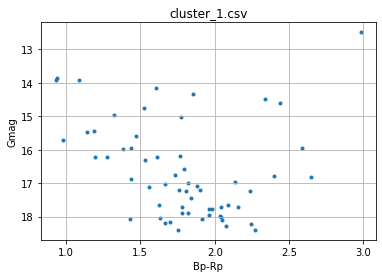

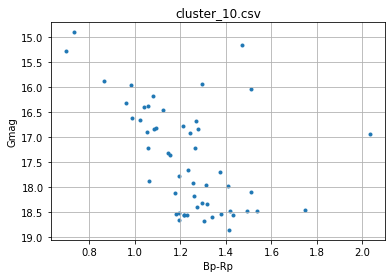

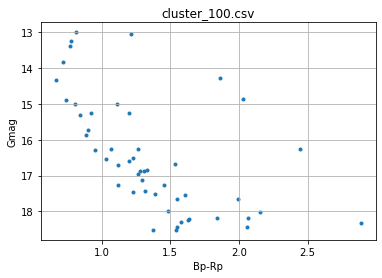

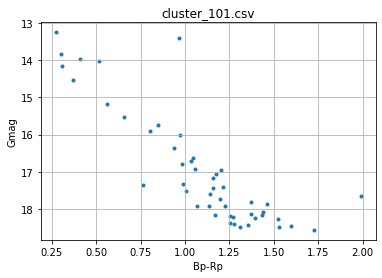

...

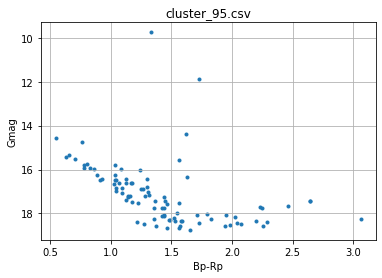

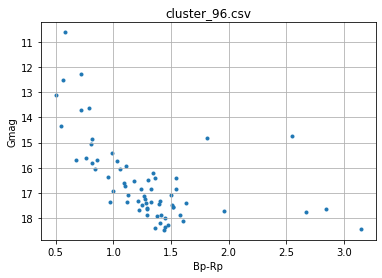

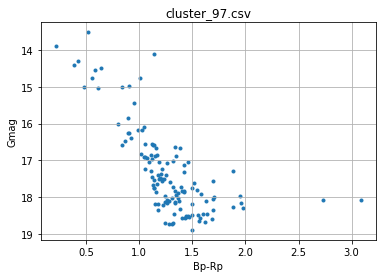

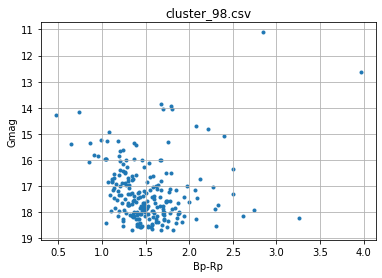

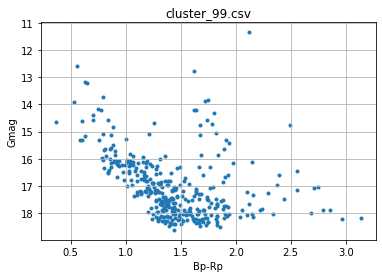

In [19]:
graficar("Q7",1)

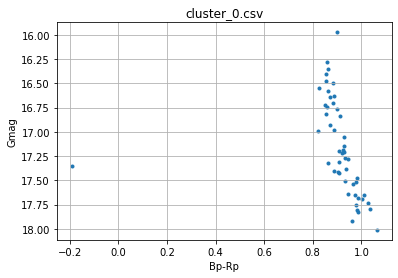

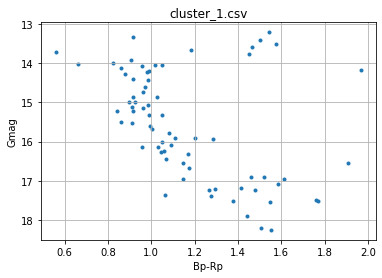

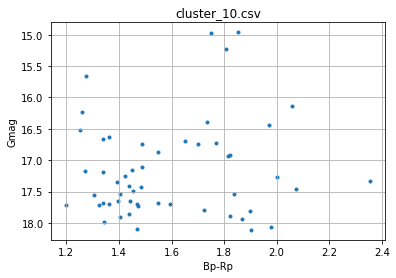

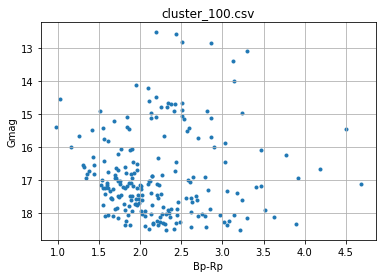

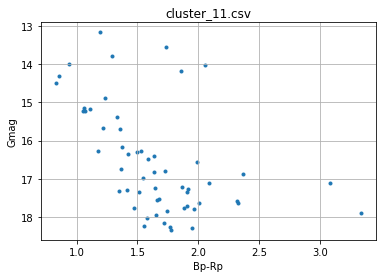

...

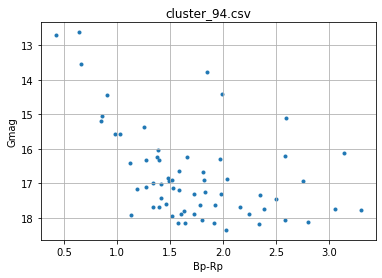

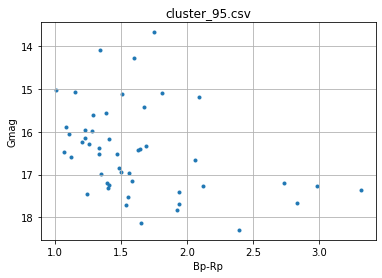

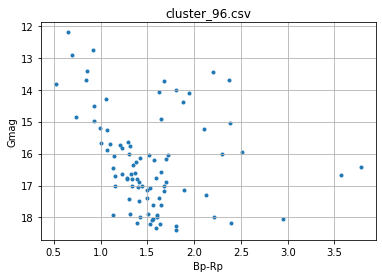

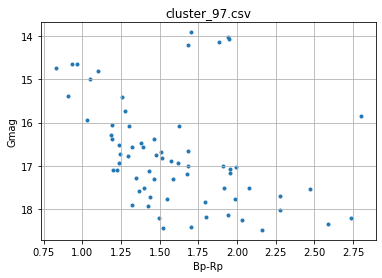

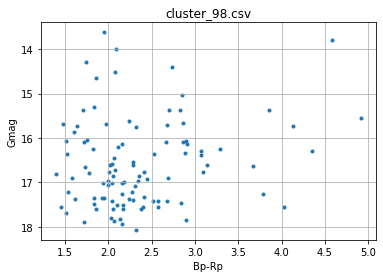

In [20]:
graficar("Q8",1)

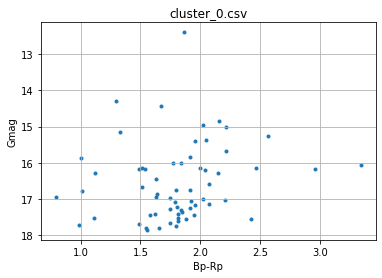

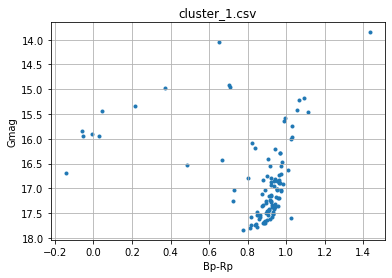

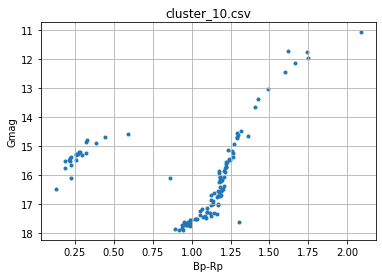

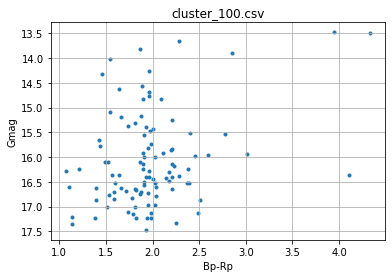

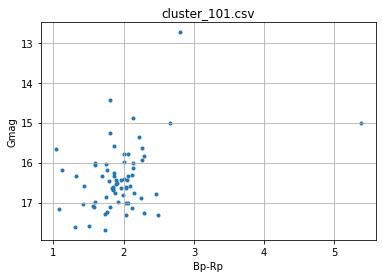

...

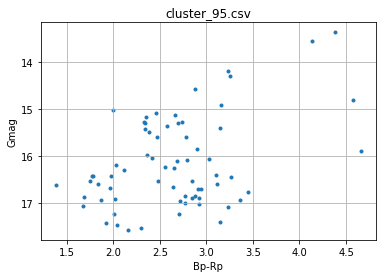

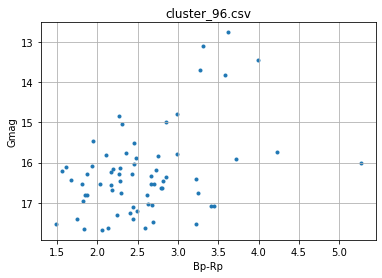

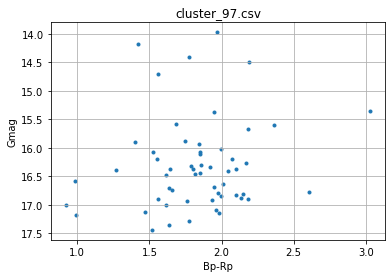

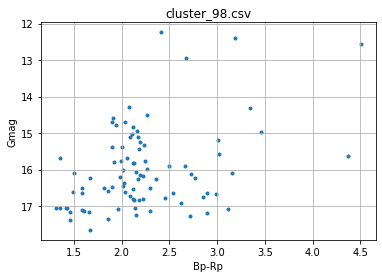

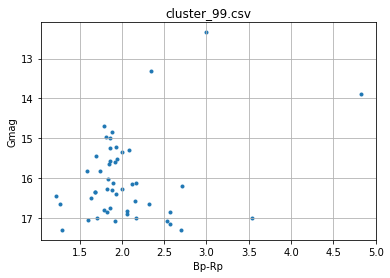

In [21]:
graficar("Q1",2)

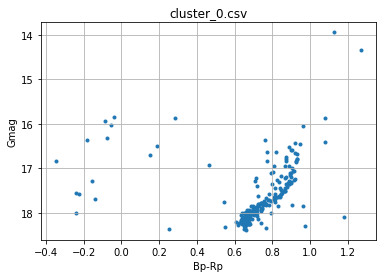

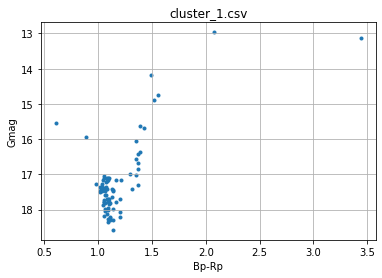

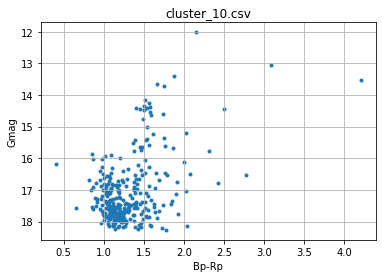

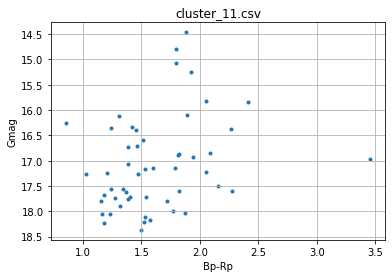

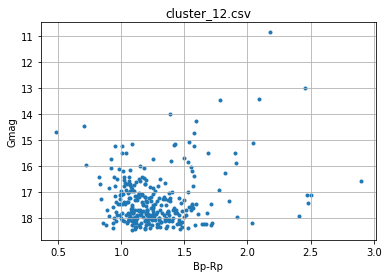

...

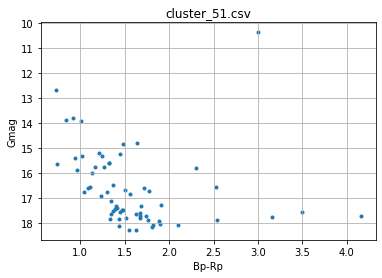

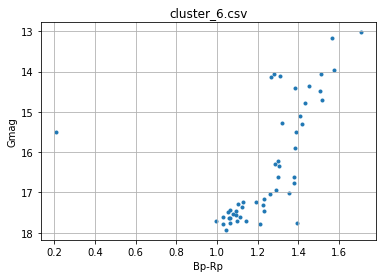

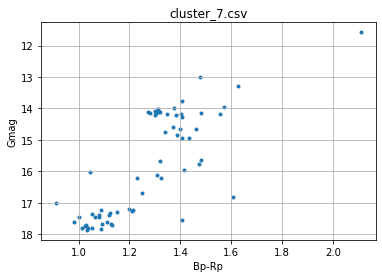

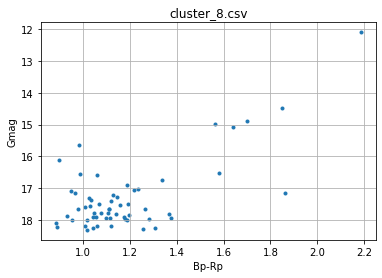

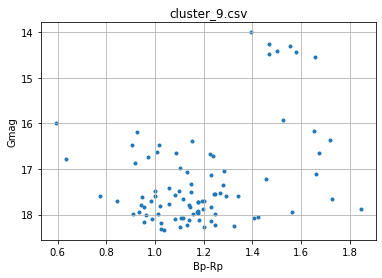

In [22]:
graficar("Q2",2)

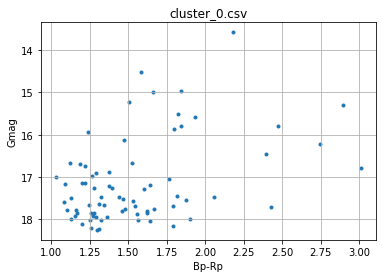

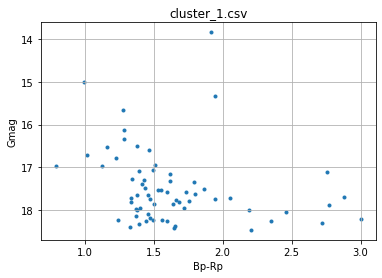

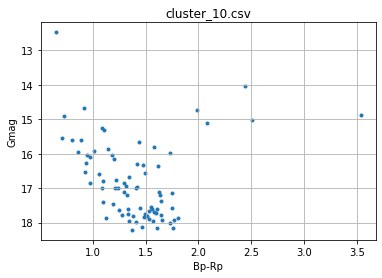

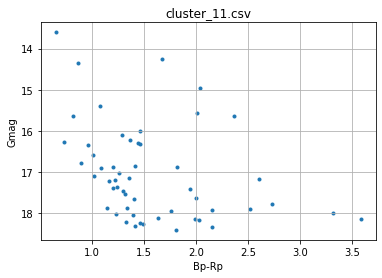

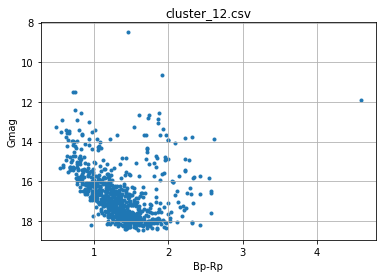

...

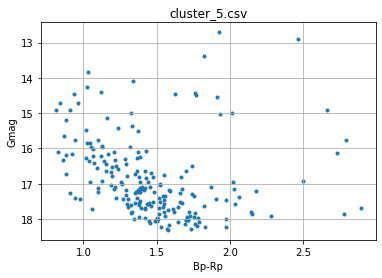

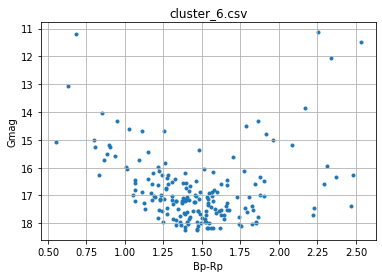

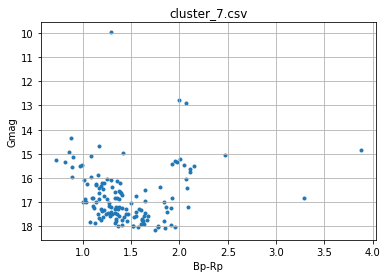

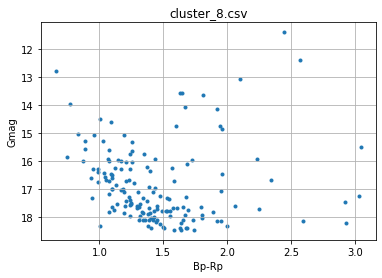

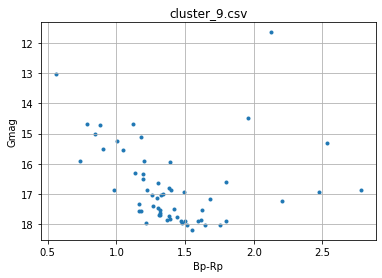

In [23]:
graficar("Q3",2)

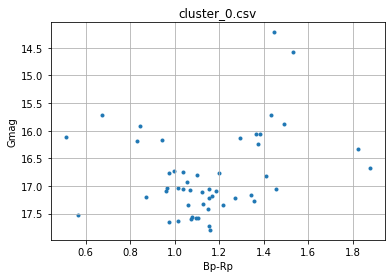

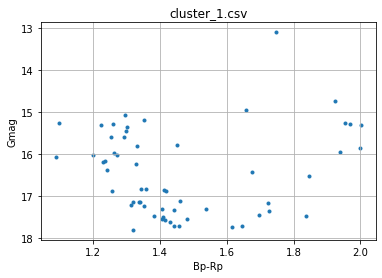

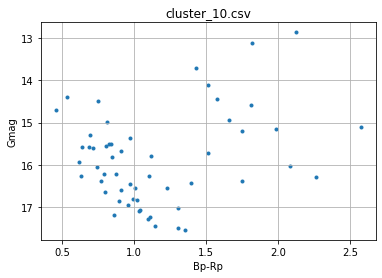

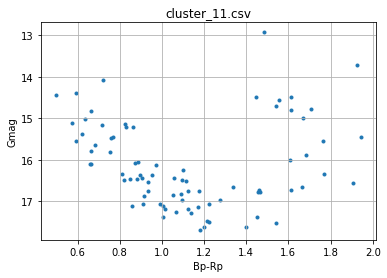

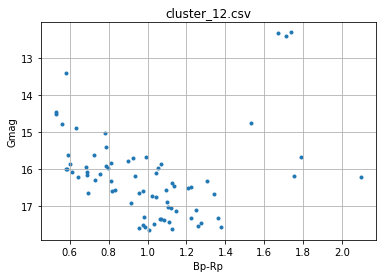

...

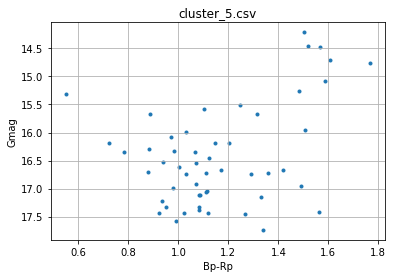

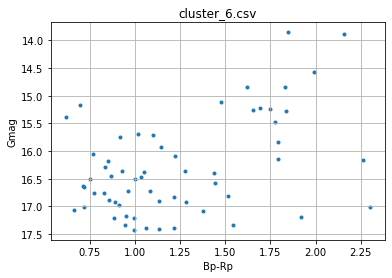

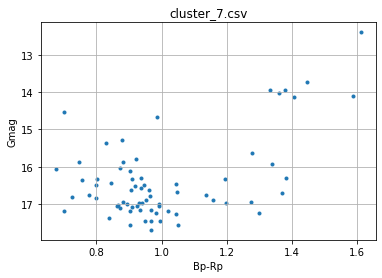

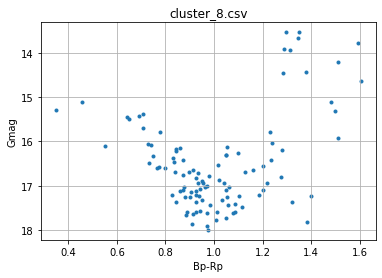

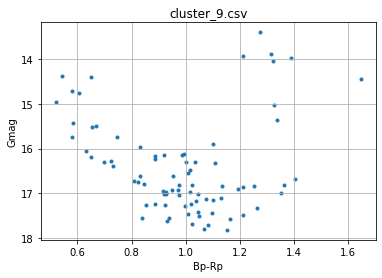

In [24]:
graficar("Q4",2)

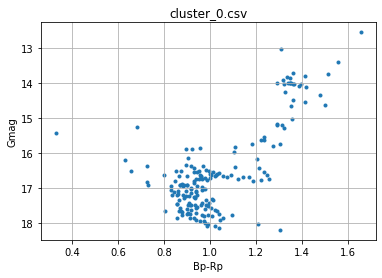

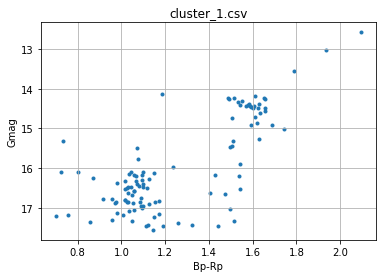

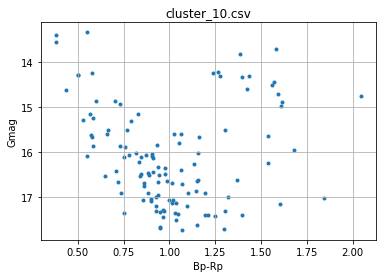

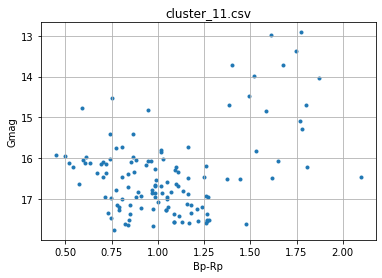

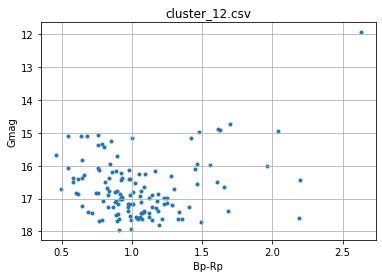

...

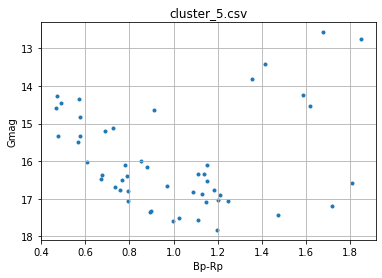

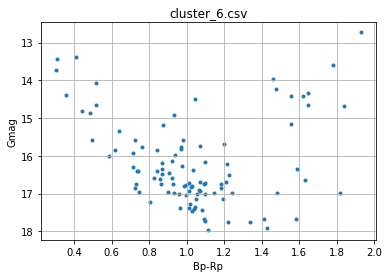

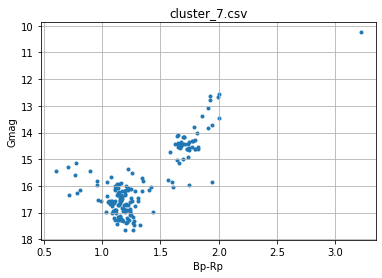

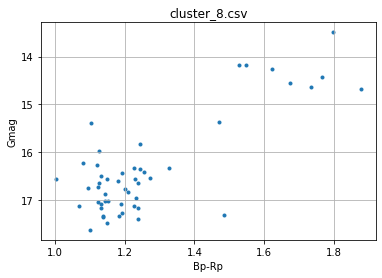

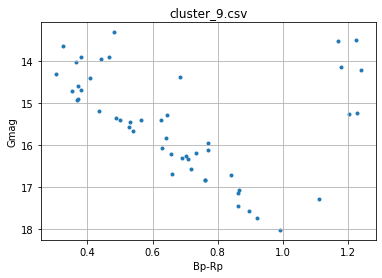

In [25]:
graficar("Q5",2)

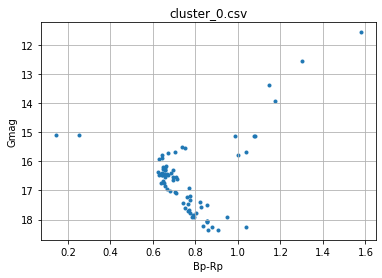

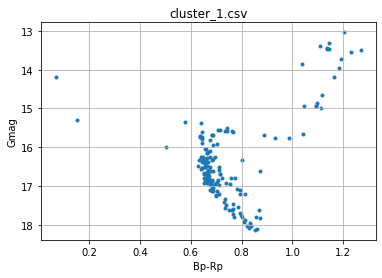

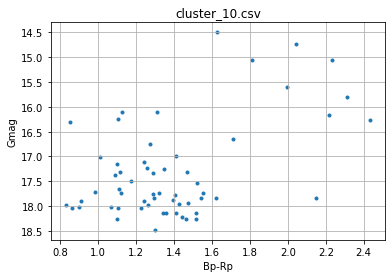

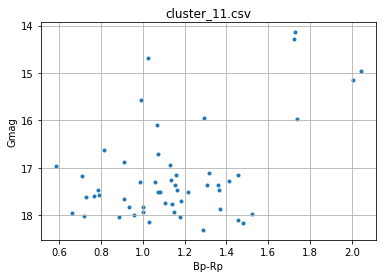

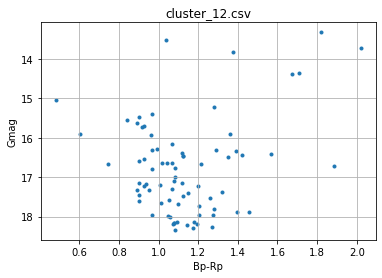

...

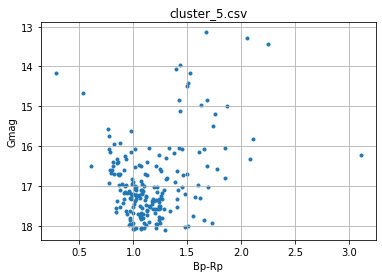

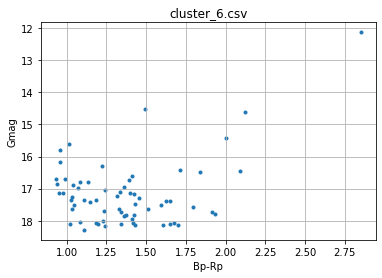

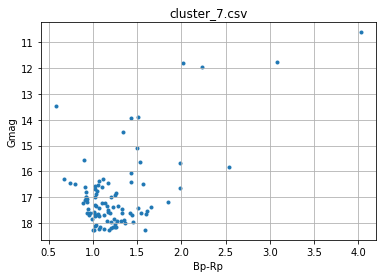

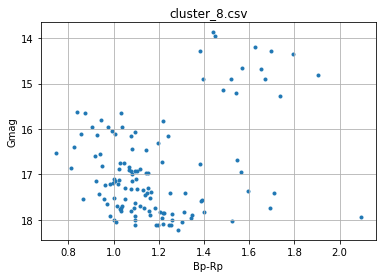

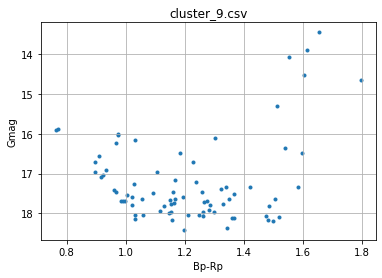

In [26]:
graficar("Q6",2)

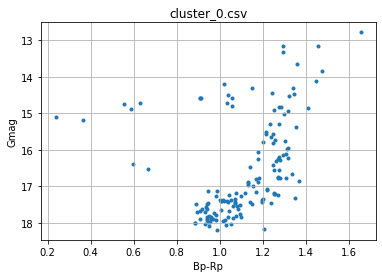

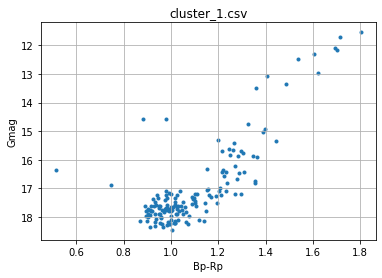

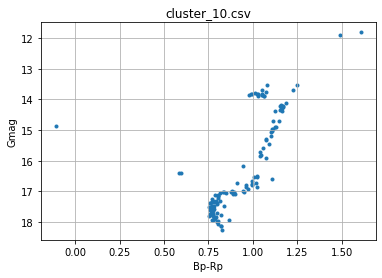

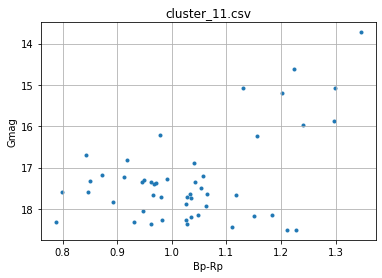

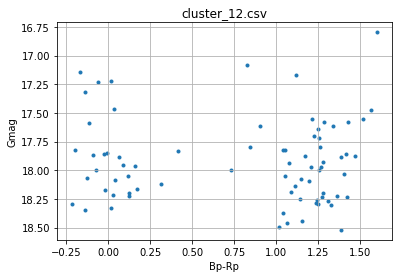

...

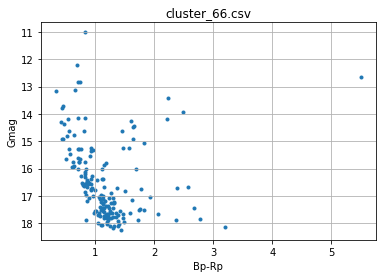

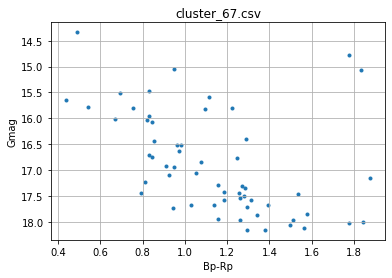

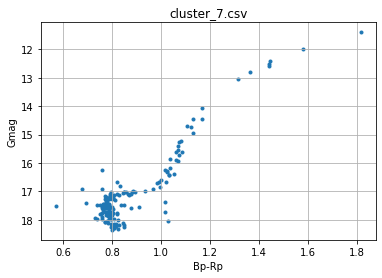

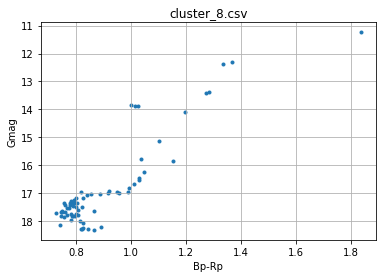

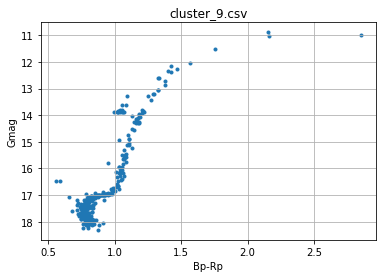

In [27]:
graficar("Q7",2)

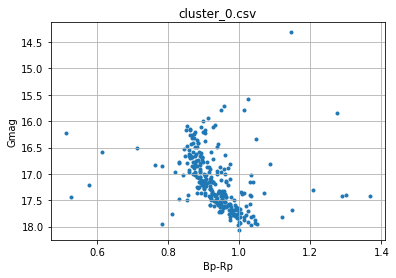

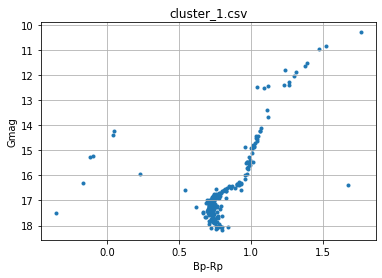

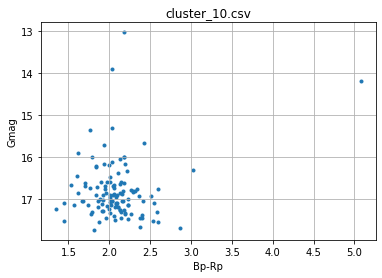

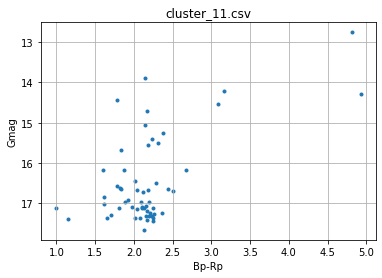

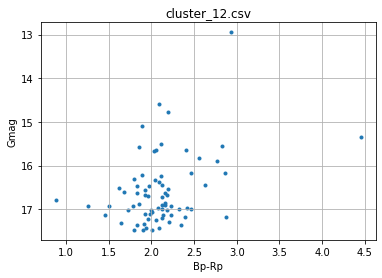

...

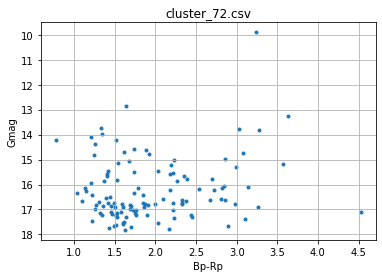

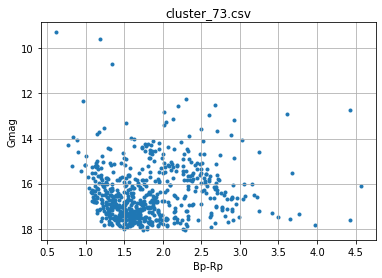

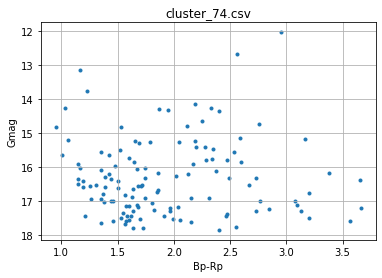

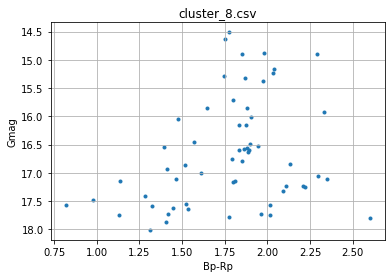

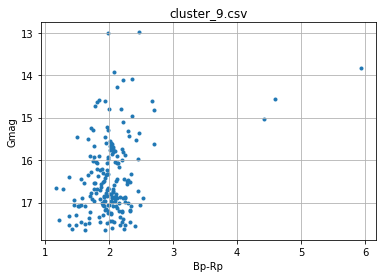

In [28]:
graficar("Q8",2)